# Rapid Assessment - Fire Hotspot Assessment

Rapid asssessment to estimate, total number of MODIS fire hotspot Collection 6 (1km) occurs in the RoI and at jurisdictional level.
Script is divided into two section
1. Historical Fire Hotspot Analysis at Jurisdictional
2. Historical Fire Hotspot Analysis at RoI

## Data Preparation and Data input
* import relevant modules
* Specify directory file path for MODIS shapefile
* Specify direrctory folder to export output 
* Specify input variables
    * projectname = name of project
    * projection = UTM projection for RoI and Shapefile
    * modis_confidence_threshold = value from 0-100, specify which >= confidence for the fire assessment

### Import Relevant Modules

In [2]:
%matplotlib inline
# import folder directory package
import os
import tkinter as tk
from tkinter import Tk, filedialog, simpledialog, messagebox
#import geospatial processing package in python
import geopandas as gpd
from geopandas.tools import sjoin
# Import geospatial visualization package in python
import geoplot as gplt
import geoplot.crs as gcrs
import mapclassify as mc
import contextily as ctx
from matplotlib_scalebar.scalebar import ScaleBar
# Import data frame calculation package
import pandas as pd
from datetime import datetime, date 
import dateutil.relativedelta as relativedelta
import numpy as np
#Import data visualization package in python
import plotly
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.figure_factory as ff

In [3]:
import ee
import geemap
try:
        ee.Initialize()
except Exception as e:
        ee.Authenticate()
        ee.Initialize()

### Specify Input Variables

In [5]:
root = Tk() # pointing root to Tk() to use it as Tk() in program.
root.withdraw() # Hides small tkinter window.
root.attributes('-topmost', True) # Opened windows will be active. above all windows despite of selection.

# specify project name
projectname = simpledialog.askstring("Input", "Speficy project name",parent=root)

if projectname is not None:
    print("The script will assess ", projectname)
else:
    print("Name has not been submitted, Restart the code!")

# specify jurisdictional name
jurisdictionalname = simpledialog.askstring("Input", "Speficy Jurrisdictional name",parent=root)

if jurisdictionalname is not None:
    print("The script will assess ", jurisdictionalname)
else:
    print("Name has not been submitted, Restart the code!")

#Specify Projection
projection = simpledialog.askstring("Input", "Specify Projection in UTM zone, example EPSG:3857", parent=root)

if projection is not None:
    print("All data will be reprojected to ", projection, ' canopy cover')
else:
    print("Projection has not specified, Restart the code!")    

# Specify minimum mapping unit - forest
modis_confidence_threshold = simpledialog.askinteger("Input", "Specify Minimimum MODIS Confidence Level",
                                              parent=root , minvalue =0, maxvalue = 100)

if modis_confidence_threshold is not None:
    print("Fire Occurrences with >= ", modis_confidence_threshold, ' will be used')
else:
    print("Confidence level has not identified, Restart the code!")
    
# Specify column name in RoI attribute table
roi_column_name = simpledialog.askstring("Input", "Specify columns name in ROI attribute table to define boundary name",parent=root)

if roi_column_name is not None:
    print("Column name is ", roi_column_name)
else:
    print("Column has not identified, Restart the code!")

The script will assess  Kubu Raya 2 Village
The script will assess  Kubu Raya
All data will be reprojected to  EPSG:32749  canopy cover
Fire Occurrences with >=  80  will be used
Column name is  namobj


### File path

In [6]:
# 1 MODIS directory file
modis_shp_file_dir = filedialog.askopenfile(title="Open MODIS Fire Hotspot Shapefile") # Returns opened path as str
# 2. Output folder
output_directory = filedialog.askdirectory(title = "Specify Output Folder")

In [7]:
# 3 Region of interest shapefile
roi_shp_file_dir = filedialog.askopenfile(title="Open RoI Shapefile")
# 4 Jurisdictional shapefile
jurisdictional_shp_file_dir = filedialog.askopenfile(title="Open Jurisdictional Shapefile")

## Data preprocessing and Fire Hotspot Occurrences Assessment

### Import RoI and reproject

In [8]:
# 1. RoI
roi_import = gpd.read_file(roi_shp_file_dir.name)
# Reproject Shapefile to UTM and convert to ee.FeatureCollection
roi_import_proj  = roi_import.to_crs(crs=projection)

# 2. Jurisdictional
jurisdictional_import = gpd.read_file(jurisdictional_shp_file_dir.name)
# Reproject Shapefile to UTM and convert to ee.FeatureCollection
jurisdictional_import_proj  = jurisdictional_import.to_crs(crs=projection)

In [9]:
# 3 Import modis shapefile to jupyter notebook
Modis_import = gpd.read_file(modis_shp_file_dir.name)

### Data preprocess

In [10]:
# 1. Subset the data based on confidence threshold and reproject
Modis_80Conf = Modis_import[(Modis_import['CONFIDENCE']) >= modis_confidence_threshold]
Modis_80Conf_proj  = Modis_80Conf.to_crs(crs=projection)

In [11]:
# 2. Select fire hotspots within polygon
# 2.1 RoI
fire_80_roi = sjoin(Modis_80Conf_proj, roi_import_proj, how='inner')
#fire_80_roi.head()

# 2.2 Jurisdiction
fire_80_jurisdictional = sjoin(Modis_80Conf_proj, jurisdictional_import_proj, how='inner')
#fire_80_jurisdictional.head(3)
# fire_80_roi.dtypes

In [12]:
# 3. convert to pandas dataframe for hotspot count calculation
# 3.1 RoI
fire_80_roi_df = pd.DataFrame(fire_80_roi)

# 5. Add new columns for time value
fire_80_roi_df['ACQ_DATE'] = pd.to_datetime(fire_80_roi_df['ACQ_DATE'])
fire_80_roi_df['Month'] = fire_80_roi_df['ACQ_DATE'].dt.month
fire_80_roi_df['Year'] = fire_80_roi_df['ACQ_DATE'].dt.year
fire_80_roi_df['Day'] = fire_80_roi_df['ACQ_DATE'].dt.day
fire_80_roi_df['YearMonth'] = fire_80_roi_df['ACQ_DATE'].dt.to_period('M')
fire_80_roi_df['MonthName']= fire_80_roi_df['ACQ_DATE'].dt.strftime("%B")
fire_80_roi_df['PointsCount'] = 1
#fire_80_roi_df.head(3)

# 3.2 Jurisdictional
fire_80_jurisdictional_df = pd.DataFrame(fire_80_jurisdictional)

# 5. Add new columns for time value
fire_80_jurisdictional_df['ACQ_DATE'] = pd.to_datetime(fire_80_jurisdictional_df['ACQ_DATE'])
fire_80_jurisdictional_df['Month'] = fire_80_jurisdictional_df['ACQ_DATE'].dt.month
fire_80_jurisdictional_df['Year'] = fire_80_jurisdictional_df['ACQ_DATE'].dt.year
fire_80_jurisdictional_df['Day'] = fire_80_jurisdictional_df['ACQ_DATE'].dt.day
fire_80_jurisdictional_df['YearMonth'] = fire_80_jurisdictional_df['ACQ_DATE'].dt.to_period('M')
fire_80_jurisdictional_df['MonthName']= fire_80_jurisdictional_df['ACQ_DATE'].dt.strftime("%B")
fire_80_jurisdictional_df['PointsCount'] = 1
#fire_80_jurisdictional_df.head(3)

### MODIS Fire Hotspot Assessment

#### Map Visualization

##### Google Earth Engine

In [13]:
# add new columns called year in the MODIS fire hotspots attribute table
# RoI
fire_80_roi_gee = fire_80_roi.copy()
fire_80_roi_gee['ACQ_DATE'] = pd.to_datetime(fire_80_roi_gee['ACQ_DATE'])
fire_80_roi_gee['Year'] = fire_80_roi_gee['ACQ_DATE'].dt.year.astype(str)
fire_80_roi_gee['ACQ_DATE'] = fire_80_roi_gee['ACQ_DATE'].astype(str)
fire_80_roi_gee['YearMonth'] = fire_80_roi_gee['YearMonth'].astype(str)

# Jurisdictional
fire_80_jurisdictional_gee = fire_80_jurisdictional.copy()
fire_80_jurisdictional_gee['ACQ_DATE'] = pd.to_datetime(fire_80_jurisdictional_gee['ACQ_DATE'])
fire_80_jurisdictional_gee['Year'] = fire_80_jurisdictional_gee['ACQ_DATE'].dt.year.astype(str)
fire_80_jurisdictional_gee['ACQ_DATE'] = fire_80_jurisdictional_gee['ACQ_DATE'].astype(str)
fire_80_jurisdictional_gee['YearMonth'] = fire_80_jurisdictional_gee['YearMonth'].astype(str)

In [14]:
# convert to ee Feature Collection
roi_gee_fc = geemap.geopandas_to_ee(roi_import_proj, geodesic=False)
jurisdictional_gee_fc = geemap.geopandas_to_ee(jurisdictional_import_proj, geodesic=False)
fire_80_roi_gee_fc = geemap.geopandas_to_ee(fire_80_roi_gee, geodesic=False)
fire_80_jurisdictional_gee_fc = geemap.geopandas_to_ee(fire_80_jurisdictional_gee, geodesic=False)

In [15]:
# Visuualization Parameters
vis_roi = {'color': '#FF0000', 'width': 2,'lineType': 'solid','fillColor': '00000000'}
vis_jurisdictional = {'color': '#000000', 'width': 2,'lineType': 'solid','fillColor': '00000000'}
vis_vector_params = {
    'color': '000000',
    #'colorOpacity': 1,
    'pointSize': 3,
    'pointShape': 'circle',
    'width': 0.5,
    'lineType': 'solid',
    #'fillColorOpacity': 0.66,
}

# legend (still not working)
year_name = ['2010', '2011', '2012', '2013', '2014','2015','2016','2017','2018','2019','2020','2021']
palette_year = ['fde725', 'c2df23', '86d549', '52c569', '2ab07f','1e9b8a','25858e','2d708e','38588c','433e85','482173','440154']
legend_dic = ee.Dictionary.fromLists(year_name, palette_year)

In [16]:
Map = geemap.Map()
Map.centerObject(jurisdictional_gee_fc, 10)
Map.addLayer(roi_gee_fc.style(**vis_roi), {}, "Region of Interest")
Map.addLayer(jurisdictional_gee_fc.style(**vis_jurisdictional), {}, "Jurisdictional")

Map.add_styled_vector(fire_80_roi_gee_fc, column="Year", palette = palette_year, layer_name="Historical Fire Hotspot Occurrence", **vis_vector_params)

#Map.add_legend(legend_keys= year_name, legend_colors = palette_year, position='bottomleft')
Map.add_legend(title = 'Fire Year', legend_dict=legend_dic, position='bottomleft')

Map

The legend dict must be a dictionary.


Map(center=[-0.38864494503834507, 109.539786812392], controls=(WidgetControl(options=['position', 'transparent…

##### Static Map - Geoplot

In [17]:
# geoplot only allows WGS 84, need to be converted to EPSG 43226
roi_proj4326 = roi_import.to_crs(crs = 'EPSG:4326')
jurisdictional_proj4326 =  jurisdictional_import.to_crs(crs = 'EPSG:4326')

# Fire in roi
fire_80_roi_4326 = fire_80_roi.to_crs(crs = 'EPSG:4326')
fire_80_roi_4326['ACQ_DATE'] = pd.to_datetime(fire_80_roi_4326['ACQ_DATE'])
fire_80_roi_4326['Year'] = fire_80_roi_4326['ACQ_DATE'].dt.year.astype(str)
fire_80_roi_4326['MonthName']= fire_80_roi_4326['ACQ_DATE'].dt.strftime("%B")
fire_80_roi_4326['Value'] = 1

# Fire in Jurisdictional
fire_80_jurisdictional_4326 = fire_80_jurisdictional.to_crs(crs = 'EPSG:4326')
fire_80_jurisdictional_4326['ACQ_DATE'] = pd.to_datetime(fire_80_jurisdictional_4326['ACQ_DATE'])
fire_80_jurisdictional_4326['Year'] = fire_80_jurisdictional_4326['ACQ_DATE'].dt.year.astype(str)
fire_80_jurisdictional_4326['MonthName']= fire_80_jurisdictional_4326['ACQ_DATE'].dt.strftime("%B")
fire_80_jurisdictional_4326['Value'] = 1
#fire_80_jurisdictional_4326

**Jurisdictional - Historical Fire Occurrences and Heatmap**

In [18]:
# function for creating point size
def identity_scale(minval, maxval):
    def scalar(val):
        return 2
    return scalar
# visualization parameters
polyplot_kwargs = {'linewidth': 1, 'edgecolor': 'white'}
polyplot_kwargs2 = {'linewidth': 0.5, 'edgecolor': '#add8e6', 'color':'#add8e6'}
pointplot_kwargs = {'scale': 'Value', 'edgecolor': 'white', 'linewidth': 0.1}
pointplot_kwargs2 = {'edgecolor': 'black', 'color':'black'}

Text(0.5, 1.0, 'Kernel Density Fire Hotspot Occurrences in Kubu Raya 2 Village ROI\n2001-02-19 00:00:00 to 2021-08-11 00:00:00')

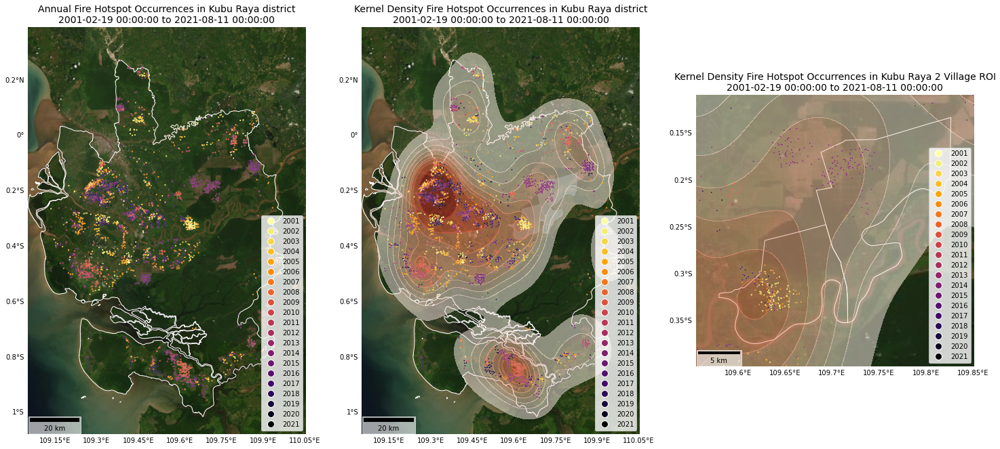

In [28]:
# Layout side by side map
f, axarr = plt.subplots(1, 3, figsize=(25, 25), subplot_kw={'projection': gcrs.WebMercator()})

# 1. historical fire occurrences
gplt.webmap(df=jurisdictional_proj4326, projection=gcrs.WebMercator(),
            provider=ctx.providers.Esri.WorldImagery, figsize=(15,12),ax = axarr[0])
gplt.polyplot(jurisdictional_proj4326, projection = gcrs.WebMercator(),
              ax = axarr[0], **polyplot_kwargs)
gplt.pointplot(fire_80_jurisdictional_4326, projection=gcrs.WebMercator(),
               legend=True, scale_func=identity_scale, hue='Year', cmap='inferno_r', legend_var='hue',
               legend_kwargs = {'frameon': True, 'loc': 'lower right'},
               ax = axarr[0], **pointplot_kwargs)  

# add xy coordinates
xycoordinate1 = axarr[0].gridlines(visible = None, draw_labels=True, dms=False, x_inline=False, y_inline=False)
xycoordinate1.top_labels=False
xycoordinate1.right_labels = False
# set scalebar
axarr[0].add_artist(ScaleBar(1, box_alpha=0.6, location = 'lower left'))
# set title and description
axarr[0].set_title("Annual Fire Hotspot Occurrences in " + jurisdictionalname + " district" + "\n" + 
                   str(fire_80_jurisdictional_4326.ACQ_DATE.min()) + " to " + str(fire_80_jurisdictional_4326.ACQ_DATE.max()), fontsize=14)

# 2. heatmap in Jurisdiction Area
gplt.webmap(df=jurisdictional_proj4326, 
            projection=gcrs.WebMercator(), provider=ctx.providers.Esri.WorldImagery, figsize=(15,12),
            ax = axarr[1])
gplt.kdeplot(fire_80_jurisdictional_4326, alpha=0.5,
             shade=True, cmap='Reds', ax = axarr[1])
gplt.polyplot(roi_proj4326, projection = gcrs.WebMercator(), alpha = 0.3,
              ax = axarr[1], **polyplot_kwargs2)
gplt.polyplot(jurisdictional_proj4326, projection = gcrs.WebMercator(),
              ax = axarr[1], **polyplot_kwargs)
gplt.pointplot(fire_80_jurisdictional_4326, projection=gcrs.WebMercator(),
               legend=True, scale_func=identity_scale, hue='Year', cmap='inferno_r', legend_var='hue',
               legend_kwargs = {'frameon': True, 'loc': 'lower right'},
               ax = axarr[1], **pointplot_kwargs)  

# add xy coordinates# add xy coordinates
xycoordinate1 = axarr[1].gridlines(visible = None, draw_labels=True, dms=False, x_inline=False, y_inline=False)
xycoordinate1.top_labels=False
xycoordinate1.right_labels = False
# set scalebar
axarr[1].add_artist(ScaleBar(1, box_alpha=0.6, location = 'lower left'))
# set title and description
axarr[1].set_title("Kernel Density Fire Hotspot Occurrences in " + jurisdictionalname + " district" + "\n" + 
                   str(fire_80_jurisdictional_4326.ACQ_DATE.min()) + " to " + str(fire_80_jurisdictional_4326.ACQ_DATE.max()), fontsize=14)

# 3. heatmap at jurisdictional fire occurrences in roi
gplt.webmap(df=jurisdictional_proj4326,
            projection=gcrs.WebMercator(), provider=ctx.providers.Esri.WorldImagery, figsize=(15,12),
            ax = axarr[2])
gplt.kdeplot(fire_80_jurisdictional_4326, alpha=0.5, legend = True,
             shade=True, cmap='Reds', ax = axarr[2])
gplt.pointplot(fire_80_jurisdictional_4326, projection=gcrs.WebMercator(),
               legend=True, scale_func=identity_scale, hue='Year', cmap='inferno_r', legend_var='hue',
               legend_kwargs = {'frameon': True, 'loc': 'lower right'},
               ax = axarr[2], **pointplot_kwargs) 
gplt.polyplot(roi_proj4326, projection = gcrs.WebMercator(),
              ax = axarr[2], **polyplot_kwargs)

# add xy coordinates# add xy coordinates
xycoordinate1 = axarr[2].gridlines(visible = None, draw_labels=True, dms=False, x_inline=False, y_inline=False)
xycoordinate1.top_labels=False
xycoordinate1.right_labels = False
# set scalebar
axarr[2].add_artist(ScaleBar(1, box_alpha=0.6, location = 'lower left'))
# set title and description
axarr[2].set_title("Kernel Density Fire Hotspot Occurrences in " + projectname + " ROI" + "\n" + 
                   str(fire_80_jurisdictional_4326.ACQ_DATE.min()) + " to " + str(fire_80_jurisdictional_4326.ACQ_DATE.max()), fontsize=14)


**RoI - Historical Fire Occurrences and Heatmap**

Text(0.5, 1.0, 'Kernel Density Fire Hotspot Occurrences Kubu Raya 2 Village ROI\n2001-02-19 00:00:00 to 2021-08-11 00:00:00')

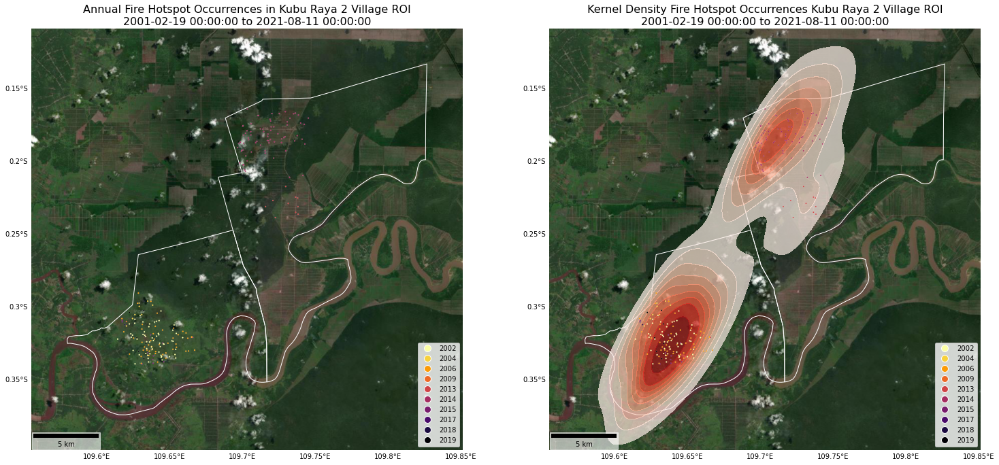

In [31]:
# layout side by side map
f2, axarr2 = plt.subplots(1, 2, figsize=(25, 25), subplot_kw={'projection': gcrs.WebMercator()})

# 1.historical fire occurrences
gplt.webmap(roi_proj4326,
            projection=gcrs.WebMercator(), provider=ctx.providers.Esri.WorldImagery, figsize=(15,12),
            ax = axarr2[0])
gplt.pointplot(fire_80_roi_4326, 
               projection=gcrs.WebMercator(), 
               legend=True, scale_func=identity_scale,hue='Year', cmap='inferno_r',legend_var='hue',
               legend_kwargs = {'frameon': True, 'loc': 'lower right'},
               ax = axarr2[0], **pointplot_kwargs)  
gplt.polyplot(roi_proj4326, 
              projection = gcrs.WebMercator(),
              ax = axarr2[0], **polyplot_kwargs)

# add xy coordinates# add xy coordinates
xycoordinate1 = axarr2[0].gridlines(visible = None, draw_labels=True, dms=False, x_inline=False, y_inline=False)
xycoordinate1.top_labels=False
xycoordinate1.right_labels = False
# set scalebar
axarr2[0].add_artist(ScaleBar(1, box_alpha=0.6, location = 'lower left'))
# set title and description
axarr2[0].set_title("Annual Fire Hotspot Occurrences in " + projectname + " ROI" + "\n" + 
                    str(fire_80_jurisdictional_4326.ACQ_DATE.min()) + " to " + str(fire_80_jurisdictional_4326.ACQ_DATE.max()), fontsize=16)


# 2. Kernell Density heatmap
gplt.webmap(df=roi_proj4326,
            projection=gcrs.WebMercator(), provider=ctx.providers.Esri.WorldImagery, figsize=(15,12),
            ax = axarr2[1])
gplt.kdeplot(fire_80_roi_4326,
             alpha=0.7,shade=True, cmap='Reds', ax = axarr2[1])
gplt.pointplot(fire_80_roi_4326, 
               projection=gcrs.WebMercator(), 
               legend=True, scale_func=identity_scale,hue='Year', cmap='inferno_r',legend_var='hue',
               legend_kwargs = {'frameon': True, 'loc': 'lower right'},
               ax = axarr2[1], **pointplot_kwargs)   
gplt.polyplot(roi_proj4326, 
              projection = gcrs.WebMercator(),ax = axarr2[1], **polyplot_kwargs)
 
# add xy coordinates# add xy coordinates
xycoordinate1 = axarr2[1].gridlines(visible = None, draw_labels=True, dms=False, x_inline=False, y_inline=False)
xycoordinate1.top_labels=False
xycoordinate1.right_labels = False
# set scalebar
axarr2[1].add_artist(ScaleBar(1, box_alpha=0.6, location = 'lower left'))
# set title and description
axarr2[1].set_title("Kernel Density Fire Hotspot Occurrences " + projectname + " ROI" + "\n" + 
                    str(fire_80_jurisdictional_4326.ACQ_DATE.min()) + " to " + str(fire_80_jurisdictional_4326.ACQ_DATE.max()), fontsize=16)


## Data Visualization

### Data Preparation

#### RoI

##### Total Fire Hotspot Occurrences by Date datasets preparation

In [32]:
# ROI
# create new data frame to ensure the time is continous
begin_date = fire_80_roi_df.ACQ_DATE.min()
end_date = fire_80_roi_df.ACQ_DATE.max()
df_helper_day = pd.DataFrame({'Points Count': 0,
                              'YearMonth':pd.date_range(start = begin_date, end = end_date)})
df_helper_day = df_helper_day.set_index('YearMonth')
df_helper_day.rename(columns={'Points Count':'PointsCount'}, inplace=True)
#df_helper_day.head(3)

In [33]:
Fire_YearMonthDay_count = pd.pivot_table(fire_80_roi_df, values='PointsCount', index='ACQ_DATE', columns= roi_column_name , aggfunc=sum, fill_value = 0)

In [34]:
Fire_Day_count_merged = pd.concat([Fire_YearMonthDay_count, df_helper_day], axis=1, sort=False)
Fire_Day_count_merged = Fire_Day_count_merged.fillna(0)
#Fire_Day_count_merged.head(3)
Fire_Day_count_merged['TotalPointsCount'] = Fire_Day_count_merged.loc[:, Fire_Day_count_merged.columns != "PointsCount"].sum(axis=1)

In [35]:
Fire_Day_count_merged = Fire_Day_count_merged.groupby(Fire_Day_count_merged.index).sum()
Fire_Day_count_merged['PointsCount'] = Fire_Day_count_merged['PointsCount'].astype('Int64')
Fire_Day_count_merged['Year'] = Fire_Day_count_merged.index.year
Fire_Day_count_merged['Day'] = Fire_Day_count_merged.index.day
Fire_Day_count_merged['Month'] = Fire_Day_count_merged.index.month
Fire_Day_count_merged['MonthName']= Fire_Day_count_merged.index.strftime("%B")
Fire_Day_count_merged['dayofyear'] = Fire_Day_count_merged.index.dayofyear
Fire_Day_count_merged['MonthYear'] = Fire_Day_count_merged.index.to_period('M')
Fire_Day_count_merged['Data'] = 'RoI'
years_range = relativedelta.relativedelta(Fire_Day_count_merged.index.max(),Fire_Day_count_merged.index.min()).years
#Fire_Day_count_merged.head(3)

##### Fire Hotspot Occurrences by Month Accross several Years datasets preparation

In [37]:
# 1 Line Chart
Fire_monthsum_year_raw = Fire_Day_count_merged.groupby(fire_80_roi_df[roi_column_name].unique().tolist() + ['MonthYear'],as_index=False).agg(pointscount=('TotalPointsCount','sum'),
                                                                                     Year=('Year', 'last'),
                                                                                     Month=('Month', 'last'),
                                                                                     MonthName = ('MonthName', 'last'))
# Fire_monthsum_year_raw.head(3)
Fire_monthsum_year = Fire_monthsum_year_raw.groupby(['MonthYear'],as_index=False).agg(pointscount=('pointscount','sum'),
                                                                                     Year=('Year', 'last'),
                                                                                     Month=('Month', 'last'),
                                                                                     MonthName = ('MonthName', 'last'))

Fire_monthsum_year['Year'] = Fire_monthsum_year['Year'].astype(str)
#Fire_monthsum_year['Month'] = Fire_monthsum_year['Month'].astype(str)
#Fire_monthsum_year.head(3)

# 2 Bar Chart
Fire_Month_count = pd.pivot_table(fire_80_roi_df, values='PointsCount', index='MonthName', columns = roi_column_name, aggfunc=sum, fill_value=0)
Fire_Month_count['TotalCounts'] = Fire_Month_count.sum(axis=1)
Fire_Month_count['CountsMeanAccrossYears'] = Fire_Month_count['TotalCounts'] /years_range
Fire_Month_count = Fire_Month_count.reindex(['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December'], axis=0)

#Fire_Month_count

##### Accumulative Fire Hotspot Occurrences by Year datasets preparation

In [38]:
accm_ = Fire_Day_count_merged.join(Fire_Day_count_merged.groupby("Year").cumsum(), rsuffix="_cumsum")
#accm_.head(30)

##### Fire Hotspot Occurrences by Year datasets preparation

In [39]:
# Data preparation
Fire_Year_count = pd.pivot_table(fire_80_roi_df, values='PointsCount', index='Year', columns = roi_column_name, aggfunc=sum, fill_value=0)
Fire_Year_count['TotalCounts'] = Fire_Year_count.sum(axis=1)
Fire_Year_count['MeanPeriods'] = Fire_Year_count['TotalCounts'].sum()/len(Fire_Year_count.index)
#Fire_Year_count

##### Fire Hotspot Occurrences by Month and Year datasets preparation

In [40]:
# 1. MODIS Hotspot count by Month and Year
Fire_MonthYear_count = pd.pivot_table(fire_80_roi_df, values='PointsCount', index='YearMonth', columns = roi_column_name, aggfunc=sum, fill_value=0)
Fire_MonthYear_count['TotalCounts'] = Fire_MonthYear_count.sum(axis=1)
Fire_MonthYear_count['Year'] = Fire_MonthYear_count.index.year
Fire_MonthYear_count['AnnualAverage'] = Fire_MonthYear_count.groupby('Year').TotalCounts.transform(lambda s: s.sum()) / Fire_MonthYear_count.groupby('Year').TotalCounts.transform(lambda s: s.count())
#Fire_MonthYear_count

#### Jurisdictional

##### Total Fire Hotspot Occurrences by Date datasets preparation

In [41]:
# create new data frame to ensure the time is continous
begin_date = fire_80_jurisdictional_df.ACQ_DATE.min()
end_date = fire_80_jurisdictional_df.ACQ_DATE.max()
df_helper_day_jurisdictional = pd.DataFrame({'Points Count': 0,                   
                              'YearMonth':pd.date_range(start = begin_date, end = end_date)})
df_helper_day_jurisdictional = df_helper_day_jurisdictional.set_index('YearMonth')
df_helper_day_jurisdictional.rename(columns={'Points Count':'PointsCount'}, inplace=True)
#df_helper_day.head(3).dtypes

In [42]:
Jurisdictional_Fire_YearMonthDay_count = pd.pivot_table(fire_80_jurisdictional_df, values='PointsCount',index='ACQ_DATE',  aggfunc=sum,fill_value = 0)
#Jurisdictional_Fire_YearMonthDay_count.head(3).dtypes

In [43]:
Jurisdictional_Fire_Day_count_merged = pd.concat([Jurisdictional_Fire_YearMonthDay_count, df_helper_day_jurisdictional], axis=1, sort=False)
Jurisdictional_Fire_Day_count_merged = Jurisdictional_Fire_Day_count_merged.fillna(0)
Jurisdictional_Fire_Day_count_merged = Jurisdictional_Fire_Day_count_merged.iloc[: , :-1]
Jurisdictional_Fire_Day_count_merged = Jurisdictional_Fire_Day_count_merged.groupby(Jurisdictional_Fire_Day_count_merged.index).sum()
Jurisdictional_Fire_Day_count_merged['PointsCount'] = Jurisdictional_Fire_Day_count_merged['PointsCount'].astype('Int64')
Jurisdictional_Fire_Day_count_merged['Year'] = Jurisdictional_Fire_Day_count_merged.index.year
Jurisdictional_Fire_Day_count_merged['Day'] = Jurisdictional_Fire_Day_count_merged.index.day
Jurisdictional_Fire_Day_count_merged['Month'] = Jurisdictional_Fire_Day_count_merged.index.month
Jurisdictional_Fire_Day_count_merged['MonthName']= Jurisdictional_Fire_Day_count_merged.index.strftime("%B")
Jurisdictional_Fire_Day_count_merged['dayofyear'] = Jurisdictional_Fire_Day_count_merged.index.dayofyear
Jurisdictional_Fire_Day_count_merged['MonthYear'] = Jurisdictional_Fire_Day_count_merged.index.to_period('M')
Jurisdictional_Fire_Day_count_merged['Data'] = 'Jurisdictional'
Jurisdictional_Fire_Day_count_merged.head(3)

,PointsCount,Year,Day,Month,MonthName,dayofyear,MonthYear,Data
2001-02-19,1,2001,19,2,February,50,2001-02,Jurisdictional
2001-02-20,0,2001,20,2,February,51,2001-02,Jurisdictional
2001-02-21,0,2001,21,2,February,52,2001-02,Jurisdictional


##### Fire Hotspot Occurrences by Month Accross several Years datasets preparation

In [45]:
# 1. Line Chart
Jurisdictional_Fire_monthsum_year = Jurisdictional_Fire_Day_count_merged.groupby(['MonthYear'],as_index=False).agg(pointscount=('PointsCount','sum'),
                                                                                     Year=('Year', 'last'),
                                                                                     Month=('Month', 'last'),
                                                                                     MonthName = ('MonthName', 'last'))

Jurisdictional_Fire_monthsum_year['Year'] = Jurisdictional_Fire_monthsum_year['Year'].astype(str)
#Jurisdictional_Fire_monthsum_year['Month'] = Jurisdictional_Fire_monthsum_year['Month'].astype(str)
#Jurisdictional_Fire_monthsum_year.dtypes

# 2. Bar Chart
Jurisdictional_Fire_Month_count = pd.pivot_table(fire_80_jurisdictional_df, values='PointsCount', index='MonthName', aggfunc=sum)
Jurisdictional_Fire_Month_count['CountsMeanAccrossYears'] = Jurisdictional_Fire_Month_count['PointsCount'] /years_range
Jurisdictional_Fire_Month_count = Jurisdictional_Fire_Month_count.reindex(['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December'], axis=0)

#Jurisdictional_Fire_Month_count

##### Accumulative Fire Hotspot Occurrences by Year datasets preparation

In [46]:
accm_jurisdictional = Jurisdictional_Fire_Day_count_merged.join(Jurisdictional_Fire_Day_count_merged.groupby("Year").cumsum(), rsuffix="_cumsum")

##### Fire Hotspot Occurrences by Year by Year datasets preparation

In [47]:
# 2. MODIS Hotspot count by Year
Jur_Fire_Year_count = pd.pivot_table(fire_80_jurisdictional_df, values='PointsCount', index='Year', aggfunc=sum)
Jur_Fire_Year_count['MeanPeriods'] = Jur_Fire_Year_count['PointsCount'].sum()/len(Jur_Fire_Year_count.index)
#Jur_Fire_Year_count.head(10)
#Jur_Fire_Year_count.dtypes

##### Fire Hotspot Occurrences by Month and Year datasets preparation

In [48]:
# 1. MODIS Hotspot count by Month and Year
Jur_Fire_MonthYear_count = pd.pivot_table(fire_80_jurisdictional_df, values='PointsCount', index='YearMonth', aggfunc=sum)
Jur_Fire_MonthYear_count['Year'] = Jur_Fire_MonthYear_count.index.year
Jur_Fire_MonthYear_count['AnnualAverage'] = Jur_Fire_MonthYear_count.groupby('Year').PointsCount.transform(lambda s: s.mean())
#Jur_Fire_MonthYear_count.head(5)

#### Jurisdictional and RoI

##### Fire Hotspot Occurrences by Year-Month Accross several Years datasets preparation

In [49]:
# modify roi dataframe to align it with jurisdictional
Roi_fire_raw = Fire_Day_count_merged.copy()
Roi_fire_raw = Roi_fire_raw.drop(fire_80_roi_df[roi_column_name].unique().tolist(), axis=1)
Roi_fire_raw = Roi_fire_raw.drop('PointsCount', axis=1)
Roi_fire_raw = Roi_fire_raw.rename(columns = {'TotalPointsCount':'PointsCount'})
Roi_fire_raw["PointsCount"] = Roi_fire_raw["PointsCount"].astype(np.int64)
#Roi_fire_raw.head(3)
#merge with jurisdictional
Roi_Jurisdictional_Fire = pd.concat([Roi_fire_raw, Jurisdictional_Fire_Day_count_merged])
#Roi_Jurisdictional_Fire

In [50]:
# Data preparation - Month Year Fire Hotspot Occurrences
# Bar Chart
Fire_Year_count_roi_jurisdiction = Roi_Jurisdictional_Fire.groupby(['MonthYear','Data'],as_index=False).agg(PointsCount=('PointsCount','sum'),
                                                                                     Year=('Year', 'last'),
                                                                                     Month=('Month', 'last'),
                                                                                     MonthName = ('MonthName', 'last'))
Fire_Year_count_roi_jurisdiction = Fire_Year_count_roi_jurisdiction.set_index('MonthYear')
Fire_Year_count_roi_jurisdiction.head(20)

# line chart
# Annual Average Fire Occurrences in RoI
Fire_Day_count_merged_AnnualAverage_roi = pd.pivot_table(fire_80_roi_df, values='PointsCount', index='YearMonth', columns = roi_column_name, aggfunc=sum, fill_value=0)
Fire_Day_count_merged_AnnualAverage_roi['TotalCounts'] = Fire_Day_count_merged_AnnualAverage_roi.sum(axis=1)
Fire_Day_count_merged_AnnualAverage_roi['Year'] = Fire_Day_count_merged_AnnualAverage_roi.index.year
Fire_Day_count_merged_AnnualAverage_roi['AnnualAverage'] = Fire_Day_count_merged_AnnualAverage_roi.groupby('Year').TotalCounts.transform(lambda s: s.sum()) / Fire_Day_count_merged_AnnualAverage_roi.groupby('Year').TotalCounts.transform(lambda s: s.count())
Fire_Day_count_merged_AnnualAverage_roi['AnnualAverage'] = Fire_Day_count_merged_AnnualAverage_roi['AnnualAverage'].astype('int')

# Annual Average Fire Occurrences in Jurisdiction
Fire_Day_count_merged_AnnualAverage_jurisdiction = pd.pivot_table(fire_80_jurisdictional_df, values='PointsCount', index='YearMonth', aggfunc=sum)
Fire_Day_count_merged_AnnualAverage_jurisdiction['TotalCounts'] = Fire_Day_count_merged_AnnualAverage_jurisdiction['PointsCount']
Fire_Day_count_merged_AnnualAverage_jurisdiction['Year'] = Fire_Day_count_merged_AnnualAverage_jurisdiction.index.year
Fire_Day_count_merged_AnnualAverage_jurisdiction['AnnualAverage'] = Fire_Day_count_merged_AnnualAverage_jurisdiction.groupby('Year').TotalCounts.transform(lambda s: s.sum()) / Fire_Day_count_merged_AnnualAverage_jurisdiction.groupby('Year').TotalCounts.transform(lambda s: s.count())
Fire_Day_count_merged_AnnualAverage_jurisdiction['AnnualAverage'] = Fire_Day_count_merged_AnnualAverage_jurisdiction['AnnualAverage'].astype('int')
#Fire_Day_count_merged_AnnualAverage_jurisdiction

##### Fire Hotspot Occurrences by Month Accross several Years datasets preparation

In [51]:
# bar chart
Fire_MonthYear_count_roi_jurisdiction_bar = Fire_Year_count_roi_jurisdiction.groupby(['Month','Data'],as_index=False).agg(PointsCount=('PointsCount','sum'),
                                                                                     Year=('Year', 'last'),
                                                                                     Month=('Month', 'last'),
                                                                                     MonthName = ('MonthName', 'last'))
Fire_MonthYear_count_roi_jurisdiction_bar = Fire_MonthYear_count_roi_jurisdiction_bar.set_index('MonthName')


# line average
Fire_Month_roi_jur_bar = pd.pivot_table(Fire_MonthYear_count_roi_jurisdiction_bar, values='PointsCount', index='MonthName', columns = 'Data', aggfunc=sum, fill_value=0)
Fire_Month_roi_jur_bar = Fire_Month_roi_jur_bar.reindex(['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December'], axis=0)
Fire_Month_roi_jur_bar['CountsMeanAccrossYears_roi'] = Fire_Month_roi_jur_bar['RoI']/years_range
Fire_Month_roi_jur_bar['CountsMeanAccrossYears_jur'] = Fire_Month_roi_jur_bar['Jurisdictional']/years_range

#Fire_Month_roi_jur_bar
#Fire_MonthYear_count_roi_jurisdiction_bar.head(30)

##### Fire Hotspot Occurrences by Years

In [52]:
# Bar Chart
Fire_Year_count_roi_jurisdiction_bar = Fire_Year_count_roi_jurisdiction.groupby(['Year','Data'],as_index=False).agg(PointsCount=('PointsCount','sum'),
                                                                                     Year=('Year', 'last'))
Fire_Year_count_roi_jurisdiction_bar = Fire_Year_count_roi_jurisdiction_bar.set_index('Year')

# line average
Fire_Month_roi_jur_bar_av = pd.pivot_table(Fire_Year_count_roi_jurisdiction_bar, values='PointsCount', index='Year', columns = 'Data', aggfunc=sum, fill_value=0)
Fire_Month_roi_jur_bar_av['TotalCounts_roi'] = Fire_Month_roi_jur_bar_av['RoI'].sum()
Fire_Month_roi_jur_bar_av['TotalCounts_jur'] = Fire_Month_roi_jur_bar_av['Jurisdictional'].sum()
Fire_Month_roi_jur_bar_av['CountsMeanAccrossYears_roi'] = Fire_Month_roi_jur_bar_av['TotalCounts_roi']/len(Fire_Month_roi_jur_bar_av.index)
Fire_Month_roi_jur_bar_av['CountsMeanAccrossYears_jur'] = Fire_Month_roi_jur_bar_av['TotalCounts_jur']/len(Fire_Month_roi_jur_bar_av.index)
Fire_Month_roi_jur_bar_av

Data,Jurisdictional,RoI,TotalCounts_roi,TotalCounts_jur,CountsMeanAccrossYears_roi,CountsMeanAccrossYears_jur
Year,,,,,,
2001,15,0,218,3225,10.380952,153.571429
2002,207,57,218,3225,10.380952,153.571429
2003,48,0,218,3225,10.380952,153.571429
2004,181,8,218,3225,10.380952,153.571429
2005,55,0,218,3225,10.380952,153.571429
2006,301,47,218,3225,10.380952,153.571429
2007,52,0,218,3225,10.380952,153.571429
2008,60,0,218,3225,10.380952,153.571429
2009,388,2,218,3225,10.380952,153.571429


### Hotspot Occurrences - RoI Vs Jurisdictional

#### 1. Total Fire Hotspot Occurrences by Year-Month between Juridictional and ROI

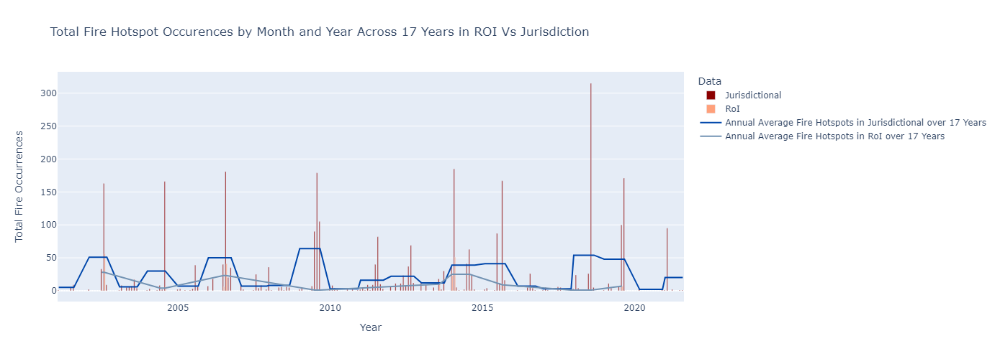

In [53]:
# Bar chart
fig_Monthyear_roi_jur_count = px.bar(Fire_Year_count_roi_jurisdiction, x = Fire_Year_count_roi_jurisdiction.index.to_timestamp(), y ='PointsCount', color = "Data",
                                     width=1400, height=500, barmode = 'group',
                                     color_discrete_sequence= ['#8B0000', '#FFA07A'],
                                     title ="Total Fire Hotspot Occurences by Month and Year Across " + str(years_range) +" Years in ROI Vs Jurisdiction", 
                                     labels = {"x": "Year","PointsCount": "Total Fire Occurrences"})
fig_Monthyear_roi_jur_count.add_traces(go.Scatter(x= Fire_Day_count_merged_AnnualAverage_jurisdiction.index.to_timestamp(), y=Fire_Day_count_merged_AnnualAverage_jurisdiction.AnnualAverage, mode = 'lines', 
                                          line=dict(color="#0047AB"), name = 'Annual Average Fire Hotspots in Jurisdictional over ' + str(years_range) + ' Years'))
fig_Monthyear_roi_jur_count.add_traces(go.Scatter(x= Fire_Day_count_merged_AnnualAverage_roi.index.to_timestamp(), y=Fire_Day_count_merged_AnnualAverage_roi.AnnualAverage, mode = 'lines', 
                                          line=dict(color="#7393B3"), name = 'Annual Average Fire Hotspots in RoI over ' + str(years_range) + ' Years'))

#### 2. Total Fire Hotspot Occurrences by Month Accross several Years

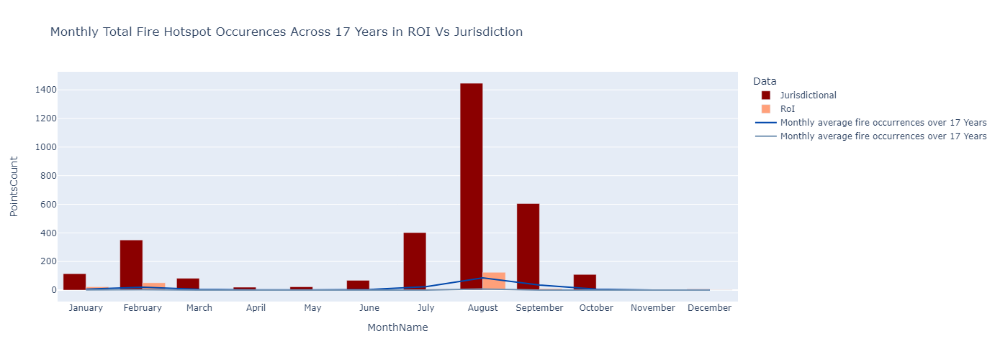

In [54]:
# Bar chart
fig_Monthyear_roi_jur_count_bar = px.bar(Fire_MonthYear_count_roi_jurisdiction_bar, x = Fire_MonthYear_count_roi_jurisdiction_bar.index, 
                                         y =Fire_MonthYear_count_roi_jurisdiction_bar.PointsCount, color = 'Data', 
                                         width=1400, height=500, color_discrete_sequence=['#8B0000', '#FFA07A'], barmode= 'group', 
                   title ="Monthly Total Fire Hotspot Occurences Across " + str(years_range) +" Years in ROI Vs Jurisdiction", 
                   labels = {"x": "Year","value": "Total Fire Occurrences"})
fig_Monthyear_roi_jur_count_bar.add_traces(go.Scatter(x= Fire_Month_roi_jur_bar.index, y=Fire_Month_roi_jur_bar.CountsMeanAccrossYears_jur, mode = 'lines', 
                                                      line=dict(color="#0047AB"), name = 'Monthly average fire occurrences over ' + str(years_range) + ' Years'))
fig_Monthyear_roi_jur_count_bar.add_traces(go.Scatter(x= Fire_Month_roi_jur_bar.index, y=Fire_Month_roi_jur_bar.CountsMeanAccrossYears_roi, mode = 'lines', 
                                                      line=dict(color="#7393B3"), name = 'Monthly average fire occurrences over ' + str(years_range) + ' Years'))


#### 3. Total Fire Hotspot Occurrences by Years

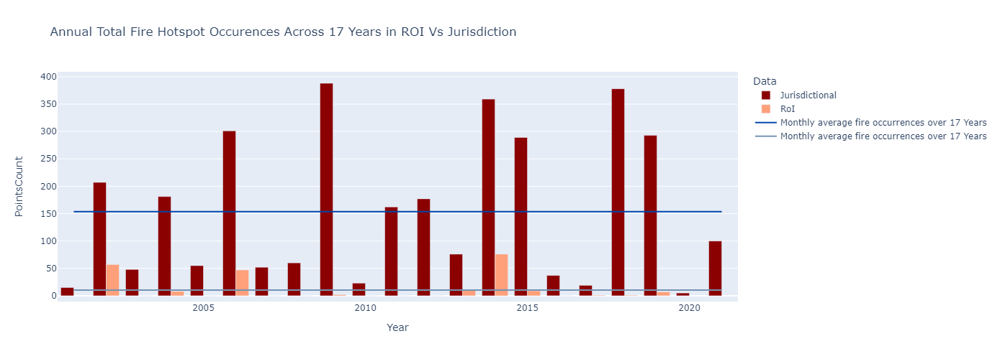

In [55]:
# Bar chart
fig_year_roi_jur_count_bar = px.bar(Fire_Year_count_roi_jurisdiction_bar, x = Fire_Year_count_roi_jurisdiction_bar.index, 
                                         y =Fire_Year_count_roi_jurisdiction_bar.PointsCount, color = 'Data', 
                                         width=1400, height=500, color_discrete_sequence=['#8B0000', '#FFA07A'], barmode= 'group', 
                   title ="Annual Total Fire Hotspot Occurences Across " + str(years_range) +" Years in ROI Vs Jurisdiction", 
                   labels = {"x": "Year","value": "Total Fire Occurrences"})
fig_year_roi_jur_count_bar.add_traces(go.Scatter(x= Fire_Month_roi_jur_bar_av.index, y=Fire_Month_roi_jur_bar_av.CountsMeanAccrossYears_jur, mode = 'lines', 
                                                      line=dict(color="#0047AB"), name = 'Monthly average fire occurrences over ' + str(years_range) + ' Years'))
fig_year_roi_jur_count_bar.add_traces(go.Scatter(x= Fire_Month_roi_jur_bar_av.index, y=Fire_Month_roi_jur_bar_av.CountsMeanAccrossYears_roi, mode = 'lines', 
                                                      line=dict(color="#7393B3"), name = 'Monthly average fire occurrences over ' + str(years_range) + ' Years'))

### Hotspot Occurrences - RoI

#### 1. Total Fire Hotspot Occurrences by Month Accross several Years

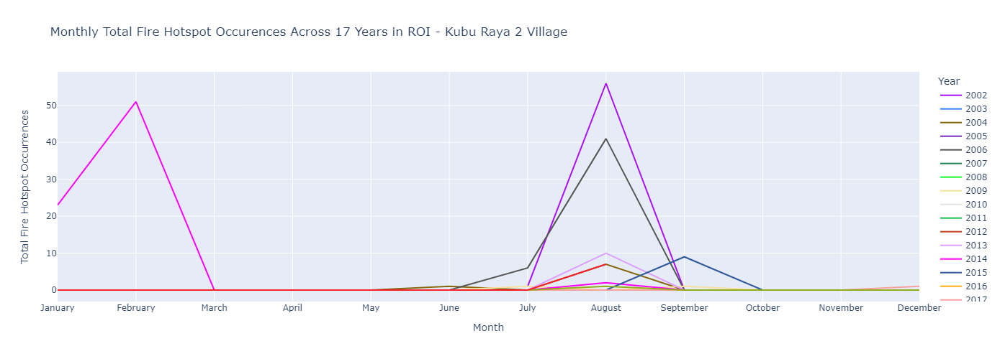

In [56]:
# 3 Historical Line Chart by months across years
month_year_linechart = px.line(Fire_monthsum_year, y="pointscount", x="Month", color="Year", width = 1200, height=500, color_discrete_sequence=px.colors.qualitative.Alphabet, 
                                        title="Monthly Total Fire Hotspot Occurences Across " + str(years_range) +" Years in ROI - " + projectname,
                                       labels={"Year": "Year",
                                                "pointscount": "Total Fire Hotspot Occurrences",
                                                "dayofyear": "Number of days"})
month_year_linechart.update_layout(
    xaxis = dict(
        tickmode = 'array',
        tickvals = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12 ],
        ticktext = ['January', 'February', 'March','April','May','June','July','August','September','October','November','December']
    )
)
month_year_linechart.show()

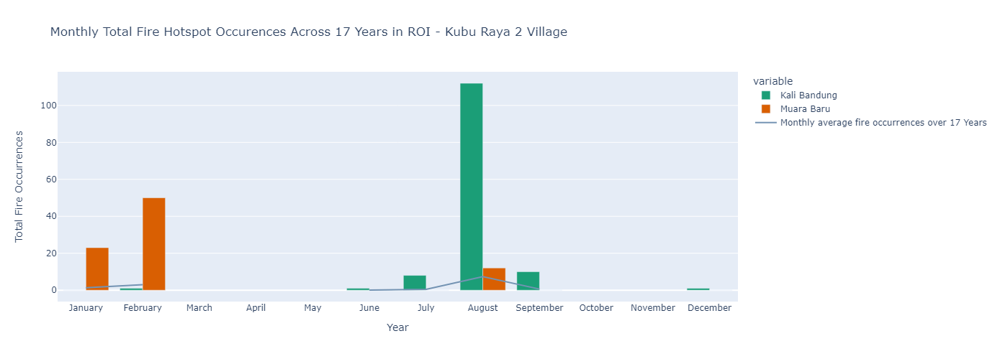

In [57]:
# Bar chart
fig_month_count = px.bar(Fire_Month_count, x = pd.Categorical(Fire_Month_count.index), y =fire_80_roi_df[roi_column_name].unique().tolist(), width=1400, height=500, 
                         color_discrete_sequence=px.colors.qualitative.Dark2, barmode= 'group', 
                   title ="Monthly Total Fire Hotspot Occurences Across " + str(years_range) +" Years in ROI - " + projectname,
                   labels = {"x": "Year","value": "Total Fire Occurrences"})
fig_month_count.add_traces(go.Scatter(x= Fire_Month_count.index, y=Fire_Month_count.CountsMeanAccrossYears, mode = 'lines', line=dict(color="#7393B3"), name = 'Monthly average fire occurrences over ' + str(years_range) + ' Years'))


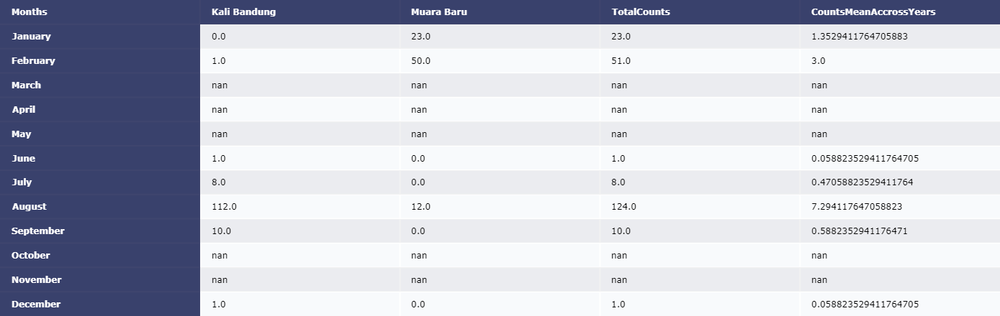

In [62]:
# Area Table
ff.create_table(Fire_Month_count, index=True, index_title="Months")

#### 2. Accumulative Fire Hotspot Occurrences by Year

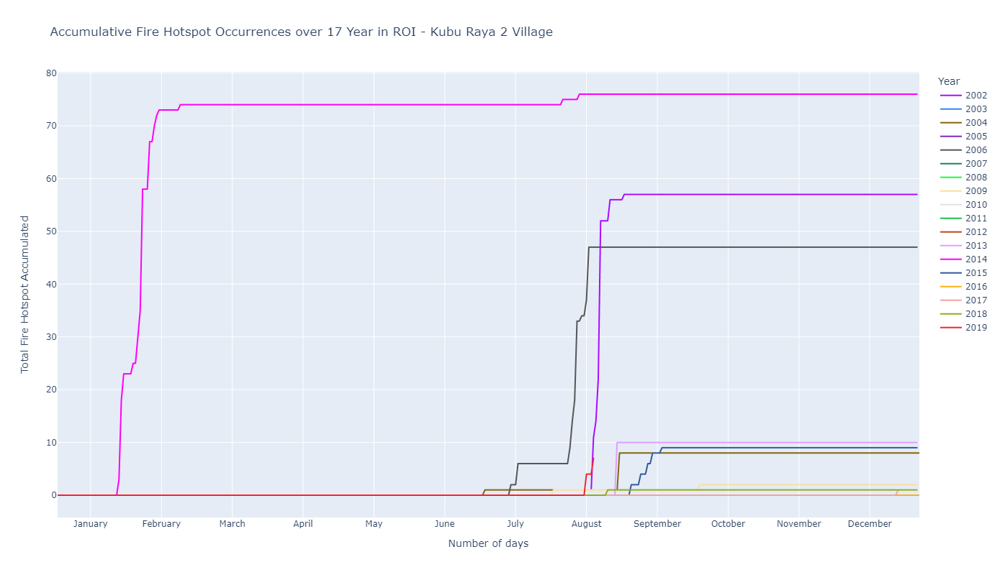

In [59]:
# Accumulative Fire Hotspot Count
accm_fig = px.line(accm_, y="TotalPointsCount_cumsum", x="dayofyear", color="Year", width=1200, height=800, color_discrete_sequence=px.colors.qualitative.Alphabet,
                   title="Accumulative Fire Hotspot Occurrences over " + str(years_range) + " Year in ROI - " + projectname,
                    labels={"Year": "Year",
                           "TotalPointsCount_cumsum": "Total Fire Hotspot Accumulated",
                           "dayofyear": "Number of days"
                             })
accm_fig.update_layout(
    xaxis = dict(
        tickmode = 'array',
        tickvals = [15, 45, 75, 105, 135, 165, 195, 225, 255, 285, 315, 345 ],
        ticktext = ['January', 'February', 'March','April','May','June','July','August','September','October','November','December']
    )
)
accm_fig.show()

#### 3. Total Fire Hotspot Occurrences by Year

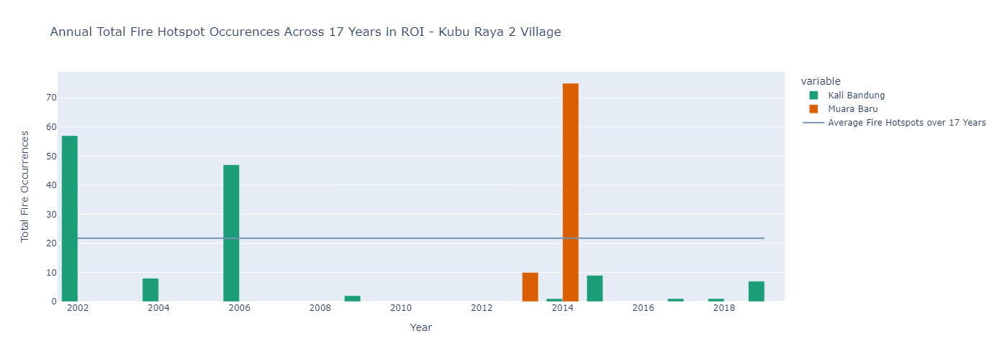

In [60]:
# Bar chart
fig_year_count = px.bar(Fire_Year_count, x = Fire_Year_count.index, y =fire_80_roi_df[roi_column_name].unique().tolist(), width=1400, height=500, 
                        color_discrete_sequence=px.colors.qualitative.Dark2, barmode= 'group', 
                   title ="Annual Total Fire Hotspot Occurences Across " + str(years_range) +" Years in ROI - " + projectname,
                   labels = {"x": "Year","value": "Total Fire Occurrences"})
fig_year_count.add_traces(go.Scatter(x= Fire_Year_count.index, y=Fire_Year_count.MeanPeriods, mode = 'lines', line=dict(color="#7393B3"), 
                                     name = 'Average Fire Hotspots over ' + str(years_range) + ' Years'))


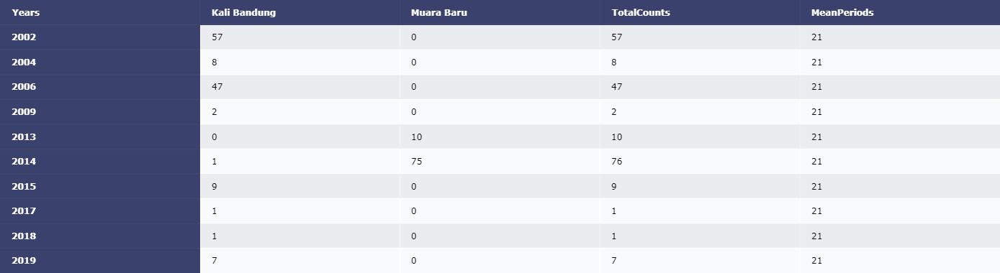

In [63]:
# Area Table
ff.create_table(Fire_Year_count.astype('int'), index=True, index_title="Years")

#### 4. Total Fire Hotspot Occurrences by Month and Year

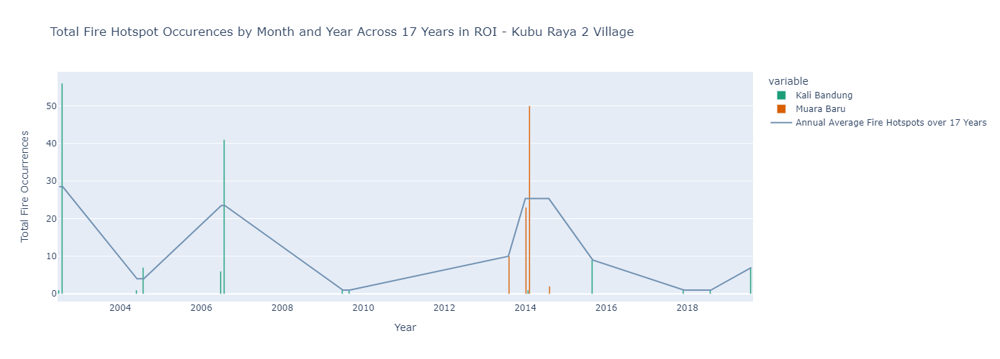

In [64]:
# Bar chart
fig_Monthyear_count = px.bar(Fire_MonthYear_count, x = Fire_MonthYear_count.index.to_timestamp(), y =fire_80_roi_df[roi_column_name].unique().tolist(), width=1400, height=500, 
                             color_discrete_sequence=px.colors.qualitative.Dark2, barmode= 'group', 
                   title ="Total Fire Hotspot Occurences by Month and Year Across " + str(years_range) +" Years in ROI - " + projectname,
                   labels = {"x": "Year","value": "Total Fire Occurrences"})
fig_Monthyear_count.add_traces(go.Scatter(x= Fire_MonthYear_count.index.to_timestamp(), y=Fire_MonthYear_count.AnnualAverage, mode = 'lines', line=dict(color="#7393B3"), name = 'Annual Average Fire Hotspots over ' + str(years_range) + ' Years'))


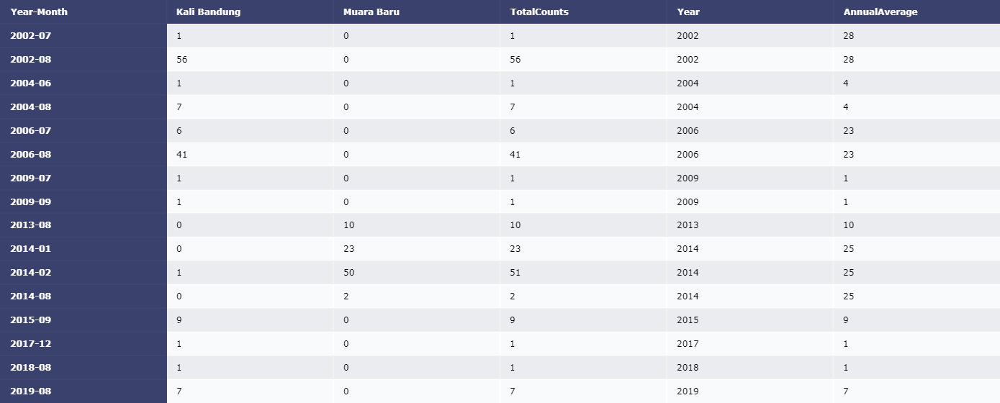

In [65]:
# Area Table
ff.create_table(Fire_MonthYear_count.astype('int'), index=True, index_title="Year-Month")

### Hotspot Occurrences - Jurisdictional

#### 1. Total Fire Hotspot Occurrences by Month Accross several Years

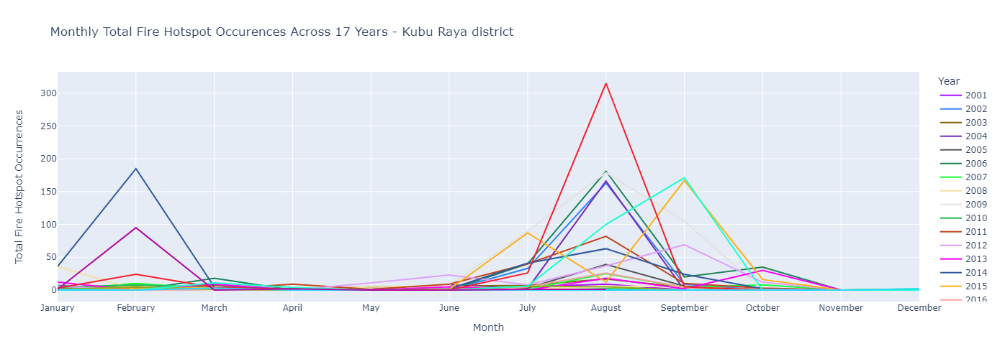

In [66]:
# 1 Line Chart
Jurisdictional_month_year_linechart = px.line(Jurisdictional_Fire_monthsum_year, y="pointscount", x="Month", color="Year", width = 1200, height=500, color_discrete_sequence=px.colors.qualitative.Alphabet,
                                        title="Monthly Total Fire Hotspot Occurences Across " + str(years_range) +" Years - " + jurisdictionalname + " district",
                                       labels={"Year": "Year",
                                                "pointscount": "Total Fire Hotspot Occurrences",
                                                "dayofyear": "Number of days"})
Jurisdictional_month_year_linechart.update_layout(
    xaxis = dict(
        tickmode = 'array',
        tickvals = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12 ],
        ticktext = ['January', 'February', 'March','April','May','June','July','August','September','October','November','December']
    )
)
Jurisdictional_month_year_linechart.show()

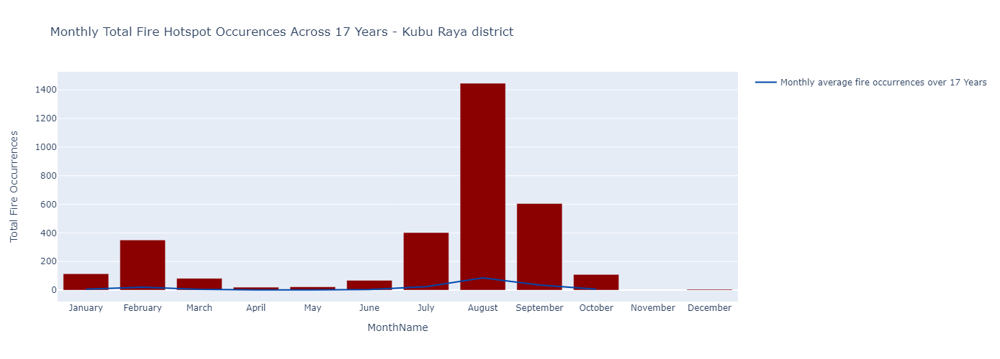

In [67]:
# 2 Bar chart
Jur_fig_month = px.bar(Jurisdictional_Fire_Month_count, x = Jurisdictional_Fire_Month_count.index, y ='PointsCount', width=1400, height=500, color_discrete_sequence= ['#8B0000'],
                        title ="Monthly Total Fire Hotspot Occurences Across " + str(years_range) +" Years - " + jurisdictionalname + " district",
                       labels = {"x": "Year",
                                 "PointsCount": "Total Fire Occurrences"})
Jur_fig_month.add_traces(go.Scatter(x= Jurisdictional_Fire_Month_count.index, y=Jurisdictional_Fire_Month_count.CountsMeanAccrossYears, mode = 'lines', 
                                    line=dict(color="#0047AB"), name = 'Monthly average fire occurrences over ' + str(years_range) + ' Years'))


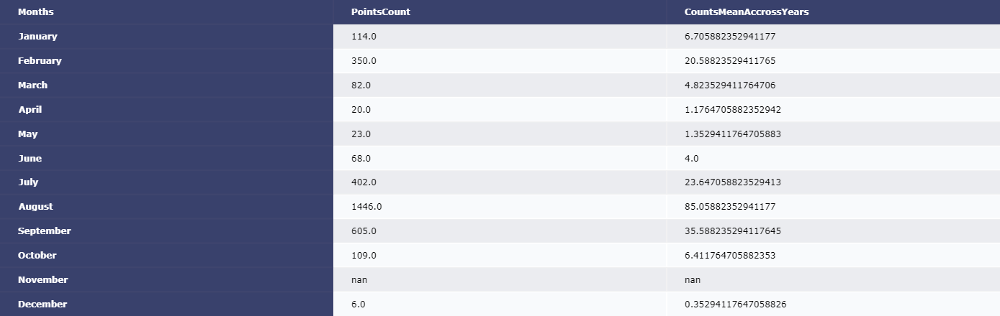

In [69]:
# Area Table
ff.create_table(Jurisdictional_Fire_Month_count, index=True, index_title="Months")

#### 2. Accumulative Fire Hotspot Occurrences by Year

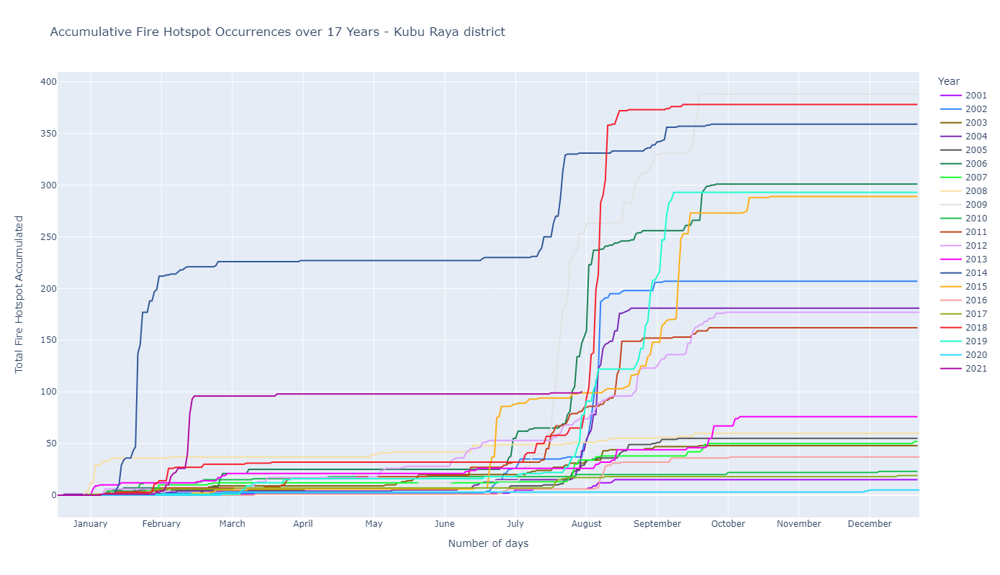

In [70]:
# Accumulative Fire Hotspot Count
accm_jurisdictional_fig = px.line(accm_jurisdictional, y="PointsCount_cumsum", x="dayofyear", color="Year", width=1200, height=800, color_discrete_sequence=px.colors.qualitative.Alphabet,
                           title="Accumulative Fire Hotspot Occurrences over " + str(years_range) +" Years - " + jurisdictionalname + " district",
                            labels={"Year": "Year",
                                    "PointsCount_cumsum": "Total Fire Hotspot Accumulated",
                                    "dayofyear": "Number of days"
                             })
accm_jurisdictional_fig.update_layout(
    xaxis = dict(
        tickmode = 'array',
        tickvals = [15, 45, 75, 105, 135, 165, 195, 225, 255, 285, 315, 345 ],
        ticktext = ['January', 'February', 'March','April','May','June','July','August','September','October','November','December']
    )
)
accm_jurisdictional_fig.show()

#### 3. Total Fire Hotspot Occurrences by Year

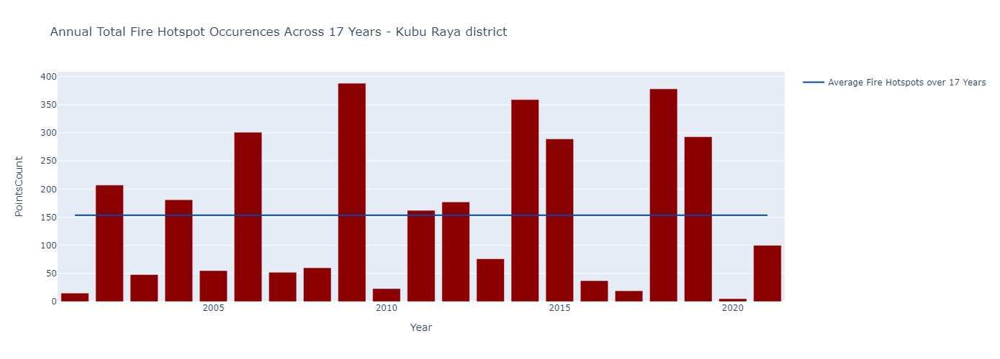

In [71]:
# Bar chart
Jur_fig_year_count = px.bar(Jur_Fire_Year_count, x = Jur_Fire_Year_count.index, y = 'PointsCount', width=1400, height=500, color_discrete_sequence= ['#8B0000'], barmode= 'group', 
                   title ="Annual Total Fire Hotspot Occurences Across " + str(years_range) +" Years - " + jurisdictionalname + " district",
                   labels = {"x": "Year","value": "Total Fire Occurrences"})
Jur_fig_year_count.add_traces(go.Scatter(x= Jur_Fire_Year_count.index, y=Jur_Fire_Year_count.MeanPeriods, mode = 'lines', 
                                         line=dict(color="#0047AB"), name = 'Average Fire Hotspots over ' + str(years_range) + ' Years'))


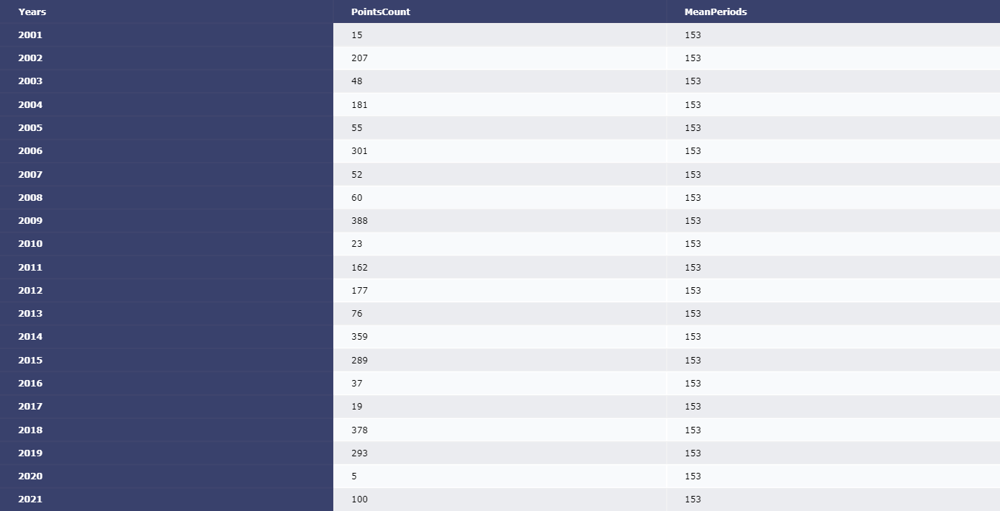

In [72]:
# Area Table
ff.create_table(Jur_Fire_Year_count.astype('int'), index=True, index_title="Years")

#### 4. Total Fire Hotspot Occurrences by Month and Year

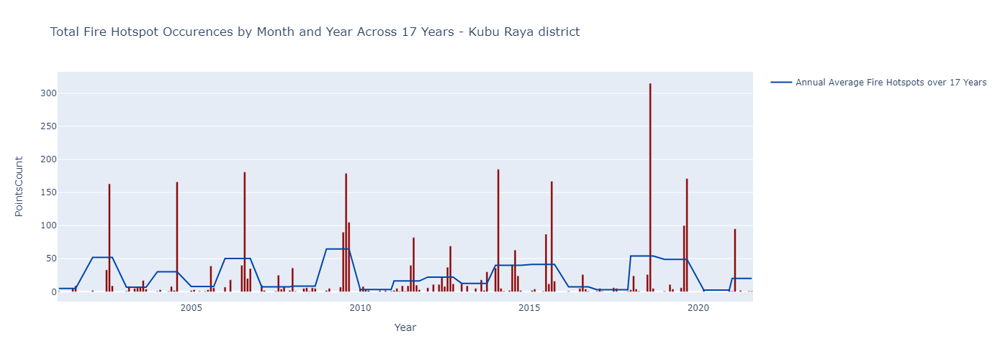

In [73]:
# Bar chart
Jur_fig_month_year_count = px.bar(Jur_Fire_MonthYear_count, x = Jur_Fire_MonthYear_count.index.to_timestamp(), y = 'PointsCount', width=1400, height=500, color_discrete_sequence= ['#8B0000'], barmode= 'group', 
                   title ="Total Fire Hotspot Occurences by Month and Year Across " + str(years_range) +" Years - " + jurisdictionalname + " district",
                   labels = {"x": "Year","value": "Total Fire Occurrences"})
Jur_fig_month_year_count.add_traces(go.Scatter(x= Jur_Fire_MonthYear_count.index.to_timestamp(), y=Jur_Fire_MonthYear_count.AnnualAverage, mode = 'lines', line=dict(color="#0047AB"), 
                                               name = 'Annual Average Fire Hotspots over ' + str(years_range) + ' Years'))


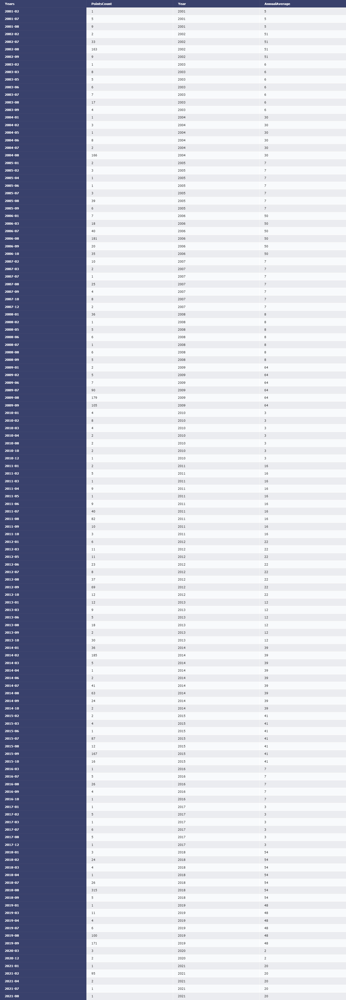

In [74]:
# Area Table
ff.create_table(Jur_Fire_MonthYear_count.astype('int'), index=True, index_title="Years")

## Export Result

In [75]:
# output directory
out_dir = os.path.expanduser(output_directory+'/geemap_FireAssement_results')
if not os.path.exists(out_dir):
    os.makedirs(out_dir)

### 1. Total Fire Hotspot Occurrences excel csv

In [76]:
# Export
Fire_Day_count_merged.to_csv(os.path.join(out_dir, projectname + '_RoI_MODIS_FireHotspotOccurrences.csv'))
Jurisdictional_Fire_Day_count_merged.to_csv(os.path.join(out_dir, jurisdictionalname + '_Jurisdictional_MODIS_FireHotspotOccurrences.csv'))

### 2. Graph

In [77]:
#1 Accumulative Fire Hotspot Roi and Jurisdictional
accm_fig.write_image(os.path.join(out_dir, projectname + '_RoI_AccumulativeFireHotspots_Graph.png'))
accm_jurisdictional_fig.write_image(os.path.join(out_dir, jurisdictionalname + '_Jurisdictional_AccumulativeFireHotspots_Graph.png'))

# 2 Total Fire Hotspots by month
month_year_linechart.write_image(os.path.join(out_dir, projectname + '_RoI_FireHotspots_byMonths_Graph.png'))
Jurisdictional_month_year_linechart.write_image(os.path.join(out_dir, jurisdictionalname + '_Jurisdictional_FireHotspots_byMonths_Graph.png'))

# 3 Total Fire Hotspots by Years
fig_year_count.write_image(os.path.join(out_dir, projectname + '_RoI_FireHotspots_byMonths_Graph.png'))
Jur_fig_year_count.write_image(os.path.join(out_dir, jurisdictionalname + '_Jurisdictional_FireHotspots_byMonths_Graph.png'))

# 4. Roi vs Jurisdiction
fig_Monthyear_roi_jur_count.write_image(os.path.join(out_dir, jurisdictionalname + " " + projectname + '_RoI_FireHotspots_byYearMonth_Graph.png'))
fig_year_roi_jur_count_bar.write_image(os.path.join(out_dir, jurisdictionalname + " " + projectname + '_RoI_FireHotspots_byYear_Graph.png'))

### 3. Map Output

<Figure size 9600x9600 with 0 Axes>

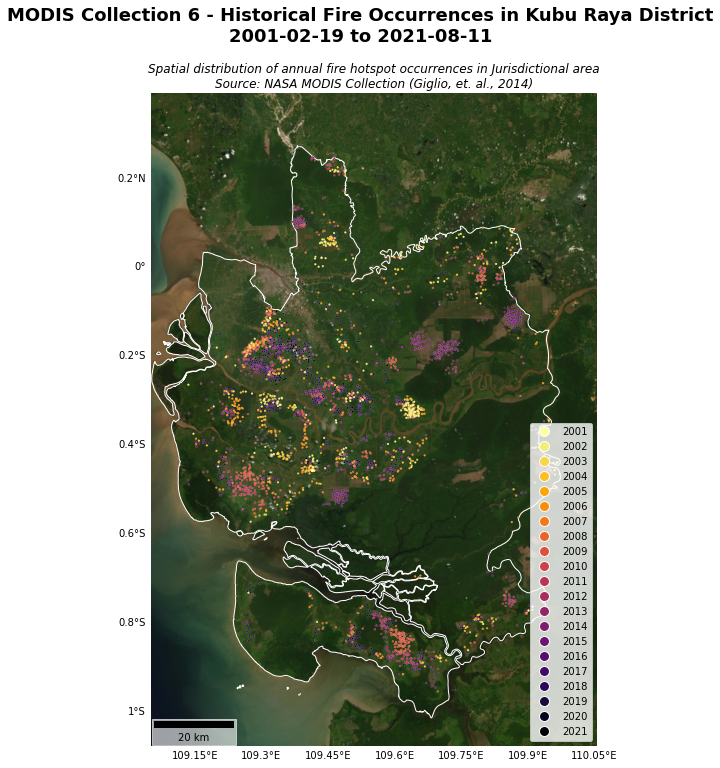

In [78]:
# 1. Historical Fire Occurrences - Jurisdictional
fig_jur_fire = plt.figure(figsize=(30,30), dpi = 320, facecolor = 'white', frameon=True)
ax_jur_export = gplt.webmap(df=jurisdictional_proj4326, projection=gcrs.WebMercator(),
                provider=ctx.providers.Esri.WorldImagery, figsize=(15,12))
ax_jur_export = gplt.polyplot(jurisdictional_proj4326, projection = gcrs.WebMercator(), **polyplot_kwargs, ax = ax_jur_export)
ax_jur_export = gplt.pointplot(fire_80_jurisdictional_4326, projection=gcrs.WebMercator(),
                   legend=True, scale_func=identity_scale, hue='Year', cmap='inferno_r', legend_var='hue',legend_kwargs = {'frameon': True, 'loc': 'lower right'},
                               ax = ax_jur_export, **pointplot_kwargs)  

ax_jur_export.add_artist(ScaleBar(1, box_alpha=0.6, location = 'lower left'))
ax_jur_export1 = ax_jur_export.gridlines(visible = None, draw_labels=True, dms=False, x_inline=False, y_inline=False)
ax_jur_export1.top_labels=False
ax_jur_export1.right_labels = False
plt.suptitle("MODIS Collection 6 - Historical Fire Occurrences in " + jurisdictionalname +" District" + "\n" + str(begin_date.date()) + " to " + str(end_date.date()) , 
                        backgroundcolor='white', fontsize=18, fontweight="bold")
plt.title('Spatial distribution of annual fire hotspot occurrences in Jurisdictional area' + '\n' + 'Source: NASA MODIS Collection (Giglio, et. al., 2014)', 
          fontsize=12, style='italic')
plt.savefig(os.path.join(out_dir, jurisdictionalname + '_Jurisdictional_FireHotspotOccurrences_Map.png'), bbox_inches='tight', 
            facecolor=fig_jur_fire.get_facecolor(), frameon = fig_jur_fire.get_frameon())


<Figure size 9600x9600 with 0 Axes>

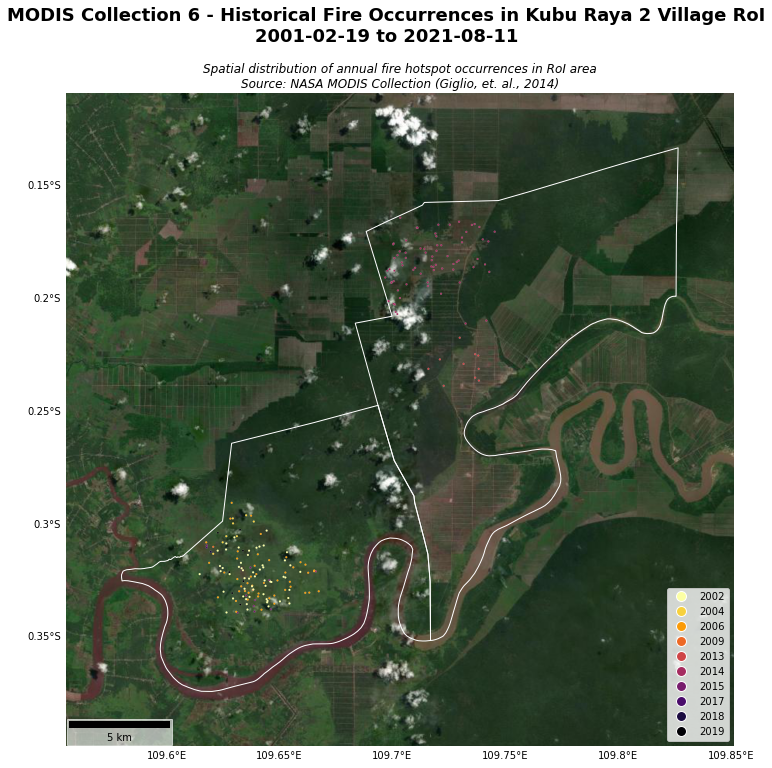

In [80]:
# 2. Historical Fire Occurrences - RoI
fig_roi_fire = plt.figure(figsize=(30,30), dpi = 320, facecolor = 'white', frameon=True)
ax_roi_export = gplt.webmap(df=roi_proj4326, projection=gcrs.WebMercator(),
                provider=ctx.providers.Esri.WorldImagery, figsize=(15,12))
ax_roi_export = gplt.pointplot(fire_80_roi_4326, projection=gcrs.WebMercator(),
                   legend=True, scale_func=identity_scale, hue='Year', cmap='inferno_r', legend_var='hue',legend_kwargs = {'frameon': True, 'loc': 'lower right'},
                               ax = ax_roi_export, **pointplot_kwargs)  
ax_roi_export = gplt.polyplot(roi_proj4326, projection = gcrs.WebMercator(), **polyplot_kwargs, ax = ax_roi_export)

ax_roi_export.add_artist(ScaleBar(1, box_alpha=0.6, location = 'lower left'))
ax_roi_export1 = ax_roi_export.gridlines(visible = None, draw_labels=True, dms=False, x_inline=False, y_inline=False)
ax_roi_export1.top_labels=False
ax_roi_export1.right_labels = False
plt.suptitle("MODIS Collection 6 - Historical Fire Occurrences in " + projectname + " RoI" +  "\n" + str(begin_date.date()) + " to " + str(end_date.date()) , 
                        backgroundcolor='white', fontsize=18, fontweight="bold")
plt.title('Spatial distribution of annual fire hotspot occurrences in RoI area' + '\n' + 'Source: NASA MODIS Collection (Giglio, et. al., 2014)', 
            fontsize=12, style='italic')
plt.savefig(os.path.join(out_dir, projectname + '_RoI_FireHotspotOccurrences_Map.png'), bbox_inches='tight', 
            facecolor=fig_roi_fire.get_facecolor(), frameon = fig_roi_fire.get_frameon())


<Figure size 9600x9600 with 0 Axes>

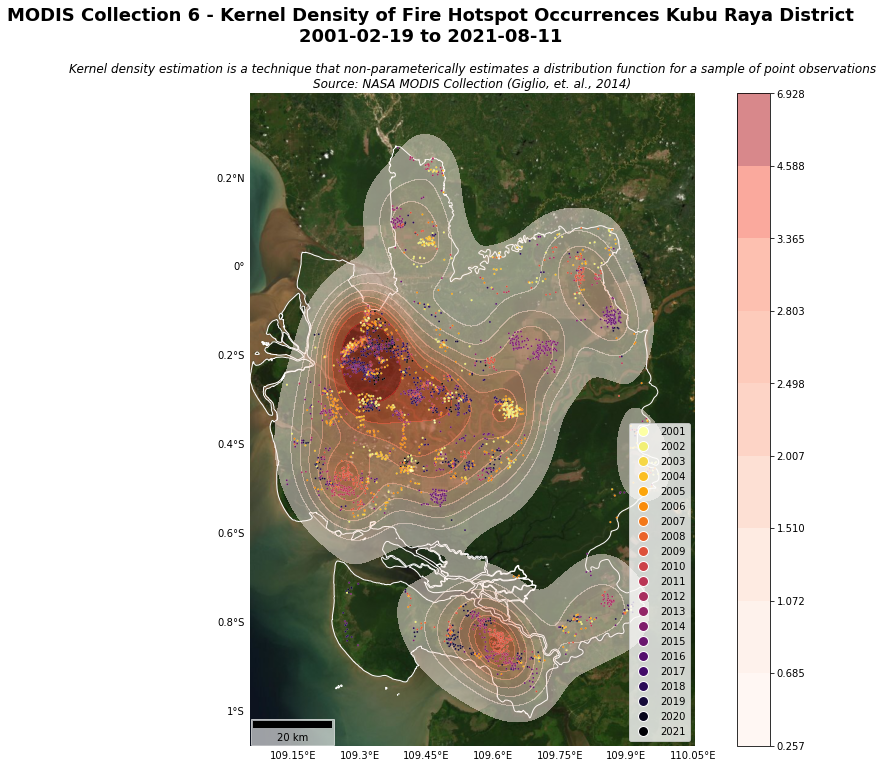

In [81]:
# 2. Heatmap
fig_jur_fire_heatmap = plt.figure(figsize=(30,30), dpi = 320, facecolor = 'white', frameon=True)
ax__hm_jur_export = gplt.webmap(df=jurisdictional_proj4326, projection=gcrs.WebMercator(),
                provider=ctx.providers.Esri.WorldImagery, figsize=(15,12))
ax__hm_jur_export = gplt.polyplot(jurisdictional_proj4326, projection = gcrs.WebMercator(), **polyplot_kwargs, ax = ax__hm_jur_export)
ax__hm_jur_export = gplt.kdeplot(fire_80_jurisdictional_4326, alpha=0.5, legend = True, cbar = True,
                                 shade=True, cmap='Reds', ax = ax__hm_jur_export) 
ax__hm_jur_export = gplt.pointplot(fire_80_jurisdictional_4326, projection=gcrs.WebMercator(),
                   legend=True, scale_func=identity_scale, hue='Year', cmap='inferno_r', legend_var='hue',legend_kwargs = {'frameon': True, 'loc': 'lower right'},
                               ax = ax__hm_jur_export, **pointplot_kwargs)   


ax__hm_jur_export.add_artist(ScaleBar(1, box_alpha=0.6, location = 'lower left'))
ax__hm_jur_export1 = ax__hm_jur_export.gridlines(visible = None, draw_labels=True, dms=False, x_inline=False, y_inline=False)
ax__hm_jur_export1.top_labels=False
ax__hm_jur_export1.right_labels = False
plt.suptitle("MODIS Collection 6 - Kernel Density of Fire Hotspot Occurrences " + jurisdictionalname +" District" + "\n" + str(begin_date.date()) + " to " + str(end_date.date()) , 
                        backgroundcolor='white', fontsize=18, fontweight="bold")
plt.title('Kernel density estimation is a technique that non-parameterically estimates a distribution function for a sample of point observations' + '\n' + 'Source: NASA MODIS Collection (Giglio, et. al., 2014)', 
            fontsize=12, style='italic')
plt.savefig(os.path.join(out_dir, jurisdictionalname + '_Jurisdictional_KDEDistribution_FireHotspotOccurrences_Map.png'), bbox_inches='tight', 
            facecolor=fig_jur_fire_heatmap.get_facecolor(), frameon = fig_jur_fire_heatmap.get_frameon())

<Figure size 9600x9600 with 0 Axes>

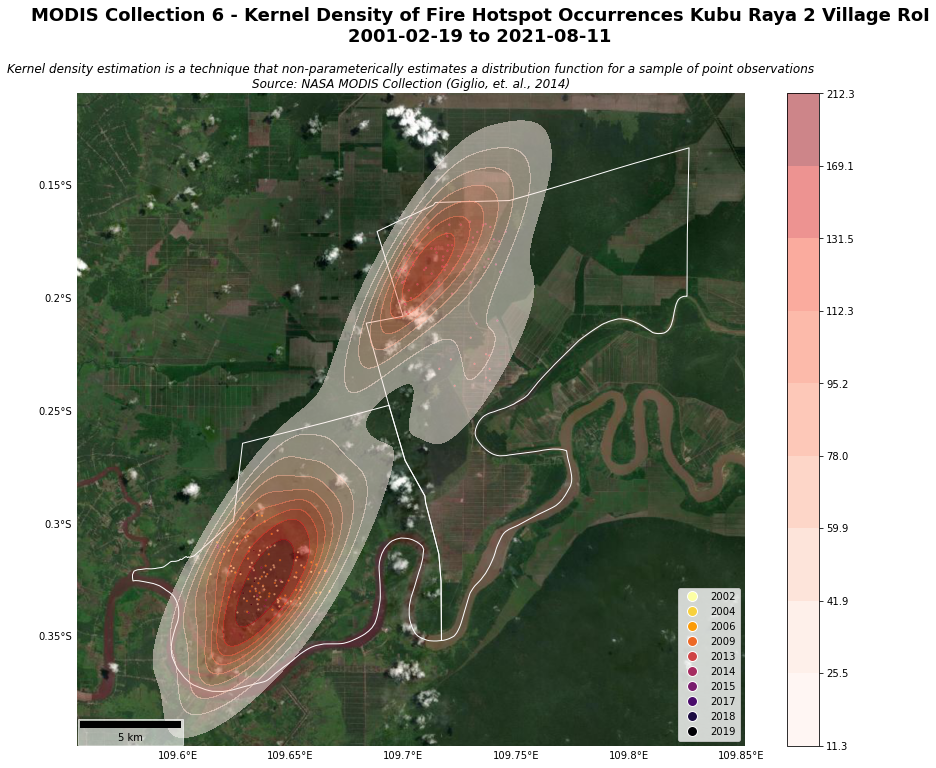

In [85]:
# 2. Heatmap - roi
fig_roi_fire_heatmap = plt.figure(figsize=(30,30), dpi = 320, facecolor = 'white', frameon=True)
ax__hm_roi_export = gplt.webmap(df=roi_proj4326, projection=gcrs.WebMercator(), provider=ctx.providers.Esri.WorldImagery, figsize=(15,12))
ax__hm_roi_export = gplt.pointplot(fire_80_roi_4326, projection=gcrs.WebMercator(),
                                   legend=True, scale_func=identity_scale, hue='Year', cmap='inferno_r', legend_var='hue',legend_kwargs = {'frameon': True, 'loc': 'lower right'},
                                   ax = ax__hm_roi_export, **pointplot_kwargs) 
ax__hm_roi_export = gplt.kdeplot(fire_80_roi_4326, alpha=0.5, legend = True, cbar = True,                                 
                                 shade=True, cmap='Reds', ax = ax__hm_roi_export) 
ax__hm_roi_export = gplt.polyplot(roi_proj4326, projection = gcrs.WebMercator(), ax = ax__hm_roi_export, **polyplot_kwargs)
 

ax__hm_roi_export.add_artist(ScaleBar(1, box_alpha=0.6, location = 'lower left'))
ax__hm_roi_export1 = ax__hm_roi_export.gridlines(visible = None, draw_labels=True, dms=False, x_inline=False, y_inline=False)
ax__hm_roi_export1.top_labels=False
ax__hm_roi_export1.right_labels = False
plt.suptitle("MODIS Collection 6 - Kernel Density of Fire Hotspot Occurrences " + projectname +" RoI" + "\n" + str(begin_date.date()) + " to " + str(end_date.date()) , 
                        backgroundcolor='white', fontsize=18, fontweight="bold")
plt.title('Kernel density estimation is a technique that non-parameterically estimates a distribution function for a sample of point observations' + '\n' + 'Source: NASA MODIS Collection (Giglio, et. al., 2014)', 
            fontsize=12, style='italic')
plt.savefig(os.path.join(out_dir, projectname + '_RoI_KDEDistribution_FireHotspotOccurrences_Map.png'), bbox_inches='tight', 
            facecolor=fig_roi_fire_heatmap.get_facecolor(), frameon = fig_roi_fire_heatmap.get_frameon())